# DEEP LEARNING: Classification, Segmentation, and Adversarial 

# 1. Overview
This assignment consists of *three main parts* for which we expect you to provide code and extensive documentation in the notebook:
* Image classification (Sect. 2)
* Semantic segmentation (Sect. 3)
* Adversarial attacks (Sect. 4)

In the first part, an end-to-end neural network for image classification it is trained. In the second part, the same is done for semantic segmentation. For these two tasks we expect you to put a significant effort into optimizing performance and as such competing with fellow students via the Kaggle competition. In the third part, you will try to find and exploit the weaknesses of your classification and/or segmentation network. For the latter there is no competition format, but we do expect you to put significant effort in achieving good performance on the self-posed goal for that part. Finally, we ask you to reflect and produce an overall discussion with links to the lectures and "real world" computer vision (Sect. 5). It is important to note that only a small part of the grade will reflect the actual performance of your networks. However, we do expect all things to work! In general, we will evaluate the correctness of your approach and your understanding of what you have done that you demonstrate in the descriptions and discussions in the final notebook.

<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = 300px, heigh = auto align=left>
</div>


KUL H02A5a Computer Vision: Group Assignment 2
---------------------------------------------------------------
Student numbers: <span style="color:red">r0827764, r0819325, r0911827</span>.  
Hector Manuel Arteaga Amate  

In this group assignment your team will delve into some deep learning applications for computer vision. The assignment will be delivered in the same groups from *Group assignment 1* and you start from this template notebook. The notebook you submit for grading is the last notebook you submit in the [Kaggle competition](https://www.kaggle.com/t/d11be6a431b84198bc85f54ae7e2563f) prior to the deadline on **Tuesday 24 May 23:59**. Closely follow [these instructions](https://github.com/gourie/kaggle_inclass) for joining the competition, sharing your notebook with the TAs and making a valid notebook submission to the competition. A notebook submission not only produces a *submission.csv* file that is used to calculate your competition score, it also runs the entire notebook and saves its output as if it were a report. This way it becomes an all-in-one-place document for the TAs to review. As such, please make sure that your final submission notebook is self-contained and fully documented (e.g. provide strong arguments for the design choices that you make). 
Most likely, this notebook format is not appropriate to run all your experiments at submission time (e.g. the training of CNNs is a memory hungry and time consuming process; due to limited Kaggle resources). It can be a good idea to distribute your code otherwise and only summarize your findings, together with your final predictions, in the submission notebook. For example, you can substitute experiments with some text and figures that you have produced "offline" (e.g. learning curves and results on your internal validation set or even the test set for different architectures, pre-processing pipelines, etc). We advise you to first go through the PDF of this assignment entirely before you really start. Then, it can be a good idea to go through this notebook and use it as your first notebook submission to the competition. You can make use of the *Group assignment 2* forum/discussion board on Toledo if you have any questions. Good luck and have fun!

--------------------------------------------------------------

## 1.1 Deep learning resources
If you did not yet explore this in *Group assignment 1 (Sect. 2)*, we recommend using the TensorFlow and/or Keras library for building deep learning models. You can find a nice crash course [here](https://colab.research.google.com/drive/1UCJt8EYjlzCs1H1d1X0iDGYJsHKwu-NO).

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
import numpy as np
import pandas as pd
import cv2 
import tensorflow as tf
import gc

from keras import layers
from keras import models 
from matplotlib import pyplot as plt

## 1.2 PASCAL VOC 2009
For this project you will be using the [PASCAL VOC 2009](http://host.robots.ox.ac.uk/pascal/VOC/voc2009/index.html) dataset. This dataset consists of colour images of various scenes with different object classes (e.g. animal: *bird, cat, ...*; vehicle: *aeroplane, bicycle, ...*), totalling 20 classes.

The training set contains 749 examples.


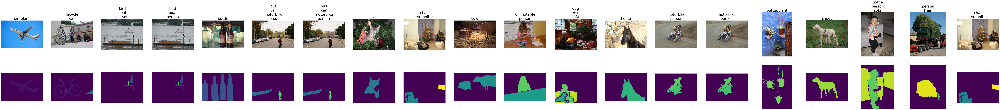

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,path,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,/kaggle/input/kul-h02a5a-computer-vision-ga2-2...,"[[[10, 8, 13], [16, 14, 19], [17, 14, 21], [19...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


In [2]:
# Loading the training data
train_df = pd.read_csv('/kaggle/input/kul-h02a5a-computer-vision-ga2-2022/train/train_set.csv', index_col="Id")
labels = train_df.columns
train_df["path"] = ['/kaggle/input/kul-h02a5a-computer-vision-ga2-2022/train/img/train_{}.npy'.format(idx) for idx, _ in train_df.iterrows()]
train_df["img"] = [np.load('/kaggle/input/kul-h02a5a-computer-vision-ga2-2022/train/img/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
train_df["seg"] = [np.load('/kaggle/input/kul-h02a5a-computer-vision-ga2-2022/train/seg/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
print("The training set contains {} examples.".format(len(train_df)))

# Show some examples
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

# The training dataframe contains for each image 20 columns with the ground truth classification labels and 20 column with the ground truth segmentation maps for each class
train_df.head(1)

In [3]:
# Loading the test data
test_df = pd.read_csv('/kaggle/input/kul-h02a5a-computer-vision-ga2-2022/test/test_set.csv', index_col="Id")
test_df["path"] = ['/kaggle/input/kul-h02a5a-computer-vision-ga2-2022/test/img/test_{}.npy'.format(idx) for idx, _ in test_df.iterrows()]
test_df["img"] = [np.load('/kaggle/input/kul-h02a5a-computer-vision-ga2-2022/test/img/test_{}.npy'.format(idx)) for idx, _ in test_df.iterrows()]
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

# The test dataframe is similar to the training dataframe, but here the values are -1 --> your task is to fill in these as good as possible in Sect. 2 and Sect. 3; in Sect. 6 this dataframe is automatically transformed in the submission CSV!
test_df.head(1)

The test set contains 750 examples.


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,path,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,/kaggle/input/kul-h02a5a-computer-vision-ga2-2...,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


## 1.3 Your Kaggle submission
Your filled test dataframe (during Sect. 2 and Sect. 3) must be converted to a submission.csv with two rows per example (one for classification and one for segmentation) and with only a single prediction column (the multi-class/label predictions running length encoded). You don't need to edit this section. Just make sure to call this function at the right position in this notebook.

In [4]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

# 2. Image classification
The goal here is simple: implement a classification CNN and train it to recognise all 20 classes (and/or background) using the training set and compete on the test set (by filling in the classification columns in the test dataframe). As a first step, we do a pre-processing of the training data. Later on, we propose a CNN architecture trained from scratch with a 2nd iteration using data augmentation. As a last iteration a couple famous architectures are used: VGG and Inception. Additionally pre-trained from the _ImageNet_ dataset are used. 

## 2.1 Preprocessing
### 2.1.1 Resize and Normalize
In a common DNN problem, a preprocessing step of the data should be performed. 
1. Extract the information from the _Pandas Dataframe_
2. Resize. The size of the images is not the same, in a CNN it is necessary that all images have the same size. It is done through the openCV library. We consider the resoluton as an hyperparameter. We find the next trade-off: the smaller, the less information to train correctly the weights of the filters. The bigger, the more space in memory it uses with the risk of over-allocate.
3. The value of each pixel is integer (0-255) We should rescale from 0-1 and convert into floating-point tensor.
4. Train labels. Encode the information into a [One-hot](https://en.wikipedia.org/wiki/One-hot) vector.  

In the next 2 cells this process is done for the train and test dataset. 

In [5]:
tr_images = []
for i in range(len(train_df)):
    df_im = train_df["img"][i]
    df_im2 = cv2.resize(df_im, dsize=(224, 224), interpolation=cv2.INTER_CUBIC)
    df_im2 = df_im2/255.
    tr_images.append(df_im2)
train_x = np.array(tr_images)

tr_labels = []
for i in range(len(train_df)):
    df_new = train_df.iloc[i, 0:20]
    tr_labels.append(df_new.to_numpy())
train_y = np.asarray(tr_labels).astype('float32')

# ITERATION: Is a different way to obtain the label.
y = np.array(train_df.drop(['path','img','seg'],axis=1)).astype('float32')


In [6]:
ts_images = []
for i in range(len(test_df)):
    df_im = test_df["img"][i]
    df_im2 = cv2.resize(df_im, dsize=(224, 224), interpolation=cv2.INTER_CUBIC)
    ts_images.append(df_im2)
test_x = np.asarray(ts_images).astype('float32')/255

It is common that the labels of some datasets are expressed as "string" values known as **categorical data**. Many machine learning algorithms and Deep Neural Networks architectures, require all input variables and output variables to be numeric. How to do that? First an _integer encoding_ step is performed. It means that each unique category is assigned to an integer value. Later on a _One-Hot Encoding_ process is performed.  
The result of a One-Hot encoding is a matrix of size $n \times c$ where $n$ is the number of samples and $c$ the number of classes. A "1" value is placed in the binary variable of the class that the image belongs and 0 to all the other classes. For the classification problem we don't need to perform a hot-encoding algorithm, because the information is already in binary shape it is only necessary to convert them from a pandas dataframe to a numpy array. In the segmentation problem, indeed, we perform a one-hot encoding algorithm. 

As it can be seen in the next cell, the label _train_y_ of the image has only a value of 1, which belongs to the class 'bottle', all the other classes are assigned to a value of 0. 

Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='object')
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


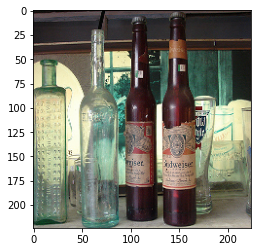

In [7]:
# INSPECTION OF LABELS/PICTURES/ONE-HOT VECTOR
print(labels)
num_img = 1
plt.imshow(train_x[num_img])
print(train_y[num_img])

### 2.1.2 Validation Dataset
As a last step, 10% of the training dataset (75 pictures), are reserved as **validation_data**. Which is important to define if the model is performing correctly. This is done through the metrics "accuracy", it is not the best metric score but it is helpful to define how good the model is. 

In [8]:
# SPLIT TRAINING DATASET --> TRAIN AND VALIDATION (10%)
# Also tried with 20% of the data as validation and the results are almost the same.
from sklearn.model_selection import train_test_split
(train_X, valX, train_Y, valY) = train_test_split(train_x, y, test_size=0.10, random_state=42)

## 2.2 Model from scratch
Through inspection of the train dataset and the "one-hot" encoded vector, we discover that we are dealing with a Multilabel classification task; François Chollet in his book _Deep learning with python_ suggests the following hyperparameters to approach this type of problem.  
- **Problem type:** _Multiclass, multilabel classification_  
- **Last-layer activation:** _Sigmoid_
- **Loss function:** _Binary_crossentropy_

With the information previously mentioned, we will build a Convolutional Neural Network in which all the parameters will be trained from scratch. The VGG architecture proposes that is better to have smaller filters, so we will be using $3 \times 3$ size. The amount of filters was selected experimentally knowing that the depth of each layer can have effect on the number of parameters to train.  
- **Activation**: Relu. Using this activation function, saves computation times on the backpropagation step because the partial derivatives will be either 0 or 1. 
- **Padding**: Only valid windows will be used. We are loosing a bit of information, but normally in the pixels located in the edge, there is no meaningful information. 
- **Stride**: Equal to 1. Selectiong a higher value would downsample the feature maps, and this action will be performed through max-pooling.
- **Downsample**: Max-pooling

<div class="alert alert-block alert-info">
<b>ITERATION 1: </b> A simple architecture designed from scratch is proposed, where approximately 2.5M of parameters should be trained. The maximum validation accuracy obtained is 18% which give us opportunity to improve changing some hyperparameters or experimenting with other techniques such as Transfer Learning or Data Augmentation.
</div>

In [9]:
def scratch_model():
    inputs = layers.Input(shape=(224,224,3))
    s = inputs
    c1 = layers.Conv2D(32, (3,3), activation='relu')(s)
    c1 = layers.MaxPooling2D((2,2))(c1)
    
    c2 = layers.Conv2D(64, (3,3), activation='relu')(c1)
    c2 = layers.MaxPooling2D((2,2))(c2)
    c3 = layers.Conv2D(128, (3,3), activation='relu')(c2)
    c3 = layers.MaxPooling2D((2,2))(c3)
    c4 = layers.Conv2D(128, (3,3), activation='relu')(c3)
    c4 = layers.MaxPooling2D((2,2))(c4)
    
    flat = layers.Flatten()(c4)
    flat = layers.Dense(128, activation='relu')(flat)
    flat = layers.Dense(128, activation='relu')(flat)
    outputs = layers.Dense(20, activation='sigmoid')(flat)
    
    scratch_model_1 = tf.keras.Model(inputs, outputs)
    return scratch_model_1

In [10]:
verbose_model = 0
scratch_model = scratch_model()
scratch_model.compile(optimizer='adam',
                      loss='binary_crossentropy',
                      metrics=['accuracy'])
history = scratch_model.fit(train_X, train_Y, epochs=20, batch_size=32, validation_data = (valX, valY), verbose = verbose_model)

2022-05-24 21:21:31.082572: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-24 21:21:31.186967: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-24 21:21:31.187952: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-24 21:21:31.189196: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

In case you want to keep track of the training in the report, feel free to change the variable _verbose_m_ in the cell to 1. For the purpose of the report we will keep it simple, and not showing all the training steps. In the next cell it is possible to analyze the curves for accuracy and loss. It's interesting how the _Validation Loss_ increases after some epochs, and we want to avoid this behavior. Something interesting is happening in the Training Accuracy, after the 12th epoch its value starts increasing considerably. We believe is because the model is **Overfitting**.  

This could happen when the model trains for too long or is to complex (we can discard both of these ideas, because as described before, this behavior starts in the 12th epoch and also the model is simple compared with other famous architectures). Our next 2 iterations are as follows: Propose a new model with _BatchNormalization()_ and _Dropout()_ layers, which are helpful to avoid overfitting, and train with Augmented data in order to train the model with new variance. 

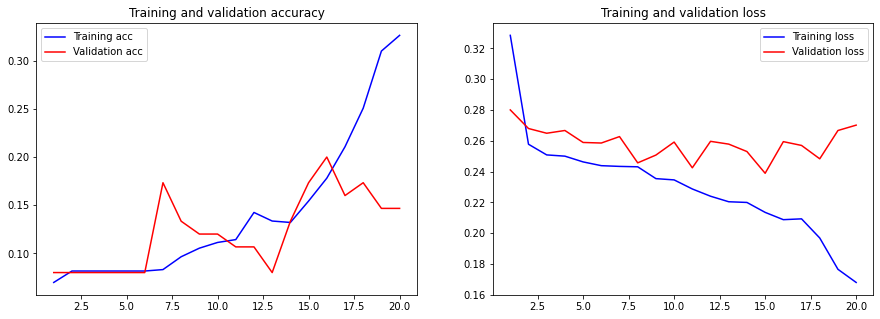

In [11]:
# GRAPHS TRAINING VS VALIDATION
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc)+1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.plot(epochs, acc, 'b', label="Training acc")
ax1.plot(epochs, val_acc, 'r', label="Validation acc")
ax1.set_title('Training and validation accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'b', label="Training loss")
ax2.plot(epochs, val_loss, 'r', label="Validation loss")
ax2.set_title('Training and validation loss')
ax2.legend()

In [12]:
# CLEANING MEMORY
del scratch_model
del history
gc.collect()

6917

<div class="alert alert-block alert-info">
<b>ITERATION 2:</b> A second architecture is proposed considering BatchNormalization() layers and Dropout() layers. Our intention was to reduce the overfitting of the previously defined model. After 25 epochs the model reaches a maximum value accuracy of 0.45 and with a maximum validation accuracy of 26%. Additionally the validation loss doesn't increase, instead it starts reducing its value over time. These 3 parameters are better than last iteration. 
</div>

**BatchNormalization():** Its main function is to normalize the inputs related to hidden layers or in this case the filters. It is done adjusting the mean and scaling of the activations. Because of this effect, the network can use higher learning rate without vanashing gradients. It is possible that we are doing a conceptual mistake, because it is prefered to use BN between the linear and non-linear layer, but because the improvement in results we will leave the experiment here and move to data augmentation. 

For example:  
- layers.Conv2D(16, (3,3))  
- layers.BatchNormalization()  
- layers.Activation('relu')

**Dropout():** It has a probabilistic effect. It removes or "drops out" inputs to a layer, which may be activations from previous layers. With this, we ensure that now we will have less parameters to train (1.3M), so we are doing the model less complex to train.


In [13]:
def scratch_model_dropout():
    inputs = layers.Input(shape=(224,224,3))
    s = inputs
    c1 = layers.Conv2D(16, (3,3), activation='relu')(s)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.MaxPooling2D((2,2))(c1)
    c1 = layers.Dropout(0.2)(c1)
    
    c2 = layers.Conv2D(32, (3,3), activation='relu')(c1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.MaxPooling2D((2,2))(c2)
    c2 = layers.Dropout(0.2)(c2)
    
    c3 = layers.Conv2D(64, (3,3), activation='relu')(c2)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.MaxPooling2D((2,2))(c3)
    c3 = layers.Dropout(0.2)(c3)
    
    c4 = layers.Conv2D(64, (3,3), activation='relu')(c3)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.MaxPooling2D((2,2))(c4)
    c4 = layers.Dropout(0.2)(c4)
    
    flat = layers.Flatten()(c4)
    flat = layers.Dense(128, activation='relu')(flat)
    flat = layers.Dropout(0.5)(flat)
    flat = layers.Dense(128, activation='relu')(flat)
    outputs = layers.Dense(20, activation='sigmoid')(flat)
    
    scratch_model_2 = tf.keras.Model(inputs, outputs)
    return scratch_model_2

In [14]:
# COMPILE THE MODEL
scratch_model2 = scratch_model_dropout()
scratch_model2.compile(optimizer='adam',
                      loss='binary_crossentropy',
                      metrics=['accuracy'])

In [15]:
#TRAIN THE MODEL
history = scratch_model2.fit(train_X, train_Y, epochs=20, batch_size=32, validation_data = (valX, valY), verbose = verbose_model)

2022-05-24 21:21:59.771400: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 405823488 exceeds 10% of free system memory.
2022-05-24 21:22:00.190731: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 405823488 exceeds 10% of free system memory.


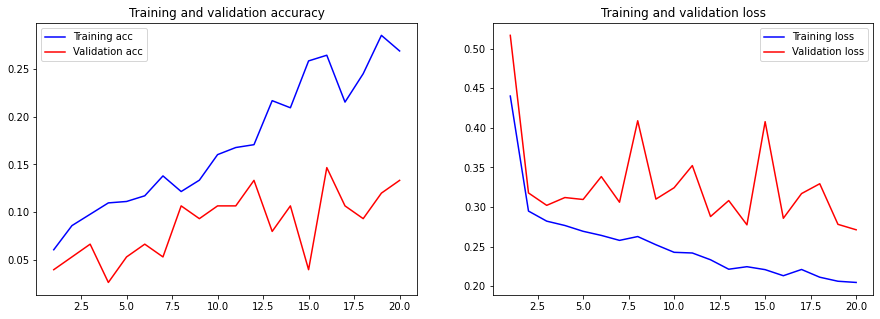

In [16]:
# TRAINING VS VALIDATION
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc)+1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.plot(epochs, acc, 'b', label="Training acc")
ax1.plot(epochs, val_acc, 'r', label="Validation acc")
ax1.set_title('Training and validation accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'b', label="Training loss")
ax2.plot(epochs, val_loss, 'r', label="Validation loss")
ax2.set_title('Training and validation loss')
ax2.legend()

Let's take a look on the prediction for one of the test dataset. In the next cell we print a random image and we allow the human to classify it, it can be concluded that a 'sofa' and a 'chair' are on it. In the second cell after this brief description we show the top 5 classes with higher probability to be in the object. Usually the output of the prediction is a one-row vector with one columnn per class. In order to display the top $N$ predictions, including the class name, and the probability that the image belongs to a certain class, the referred cell is proposed. The probability value indicate how possible is that the class is present on the image. This is not exclusive, so it could mean that more than 2 classes are present on the image.  
Once we make the prediction for the picture, the model defines as the top 3 options: cat, sofa and bird. If we think this is wrong, and we confirm that our "scratch-model" is not correct, therefore we will move on to different approaches. 

NOTE: The training could differ while compiling the code in different times, so it is clear that the image is not classified correctly but the main label could differ for each experiment. It could happen that the misslabel is a person, or a bird, but the intention is to show the bad behavior of the model.  

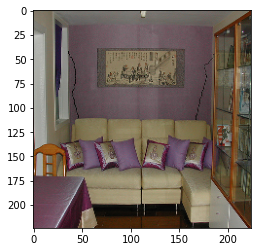

In [17]:
## INSPECT PREDICTION OF ONE IMAGE
img = test_x[2]
img2 = np.expand_dims(img, axis=0)
plt.imshow(img)

In [18]:
# PROBABILITIES
classes = np.array(df.columns[0:20])
prob = scratch_model2.predict(img2)
sorted_categories = np.argsort(prob[0])[:-11:-1]
for i in range(5):
    print("{}".format(classes[sorted_categories[i]]) +"({:.3})".format(prob[0][sorted_categories[i]]))

person(0.351)
sofa(0.252)
pottedplant(0.236)
dog(0.146)
cat(0.141)


In [19]:
# CLEANING MEMORY
del scratch_model2
del history
gc.collect()

4919

<div class="alert alert-block alert-info">
<b>ITERATION 3, DATA AUGMENTATION:</b> We consider that the training set (750) is small compared with the amount of weights to train. A possible solution to overcome with this situation is to augment each of the training images. For that, we use Data Augmentation. We use the ImageDataGenerator() function in which we propose rotations, zoom, shifts in position, etc. 
</div>

[Data Augmentation](https://www.tensorflow.org/tutorials/images/data_augmentation) is a technique to increase the diversity (variance) of the training set by applying random and realistic transformations, such as rotations or change in brightness. The results were not as promising as expected, probably we are not implementing correctly the function. Another option that we can further explore is use the Keras preprocessing layers as they are shown in the hyperlink on this paragraph. We stopped exploring this option because we got good results using pre-defined architectures and pre-trained weights. We are not showing the results of the training, but the reader can uncomment the training cell and confirm the poorly behavior of the model. 

In [20]:
# DATA AUGMENTATION
# Defining an ImageDataGenerator, the batch_size will be related with the steps_per_epoch
from keras.preprocessing.image import ImageDataGenerator
batch_s = 15
train_datagen = ImageDataGenerator(rotation_range = 40, 
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.4,
                                   horizontal_flip = True,
                                   fill_mode = 'nearest')
test_datagen = ImageDataGenerator()

# train_generator = train_datagen.flow(train_X, train_Y, batch_size = batch_s)
# validation_generator = test_datagen.flow(valX, valY, batch_size = batch_s)

# COMPILE THE MODEL
# scratch_model2 = scratch_model_dropout()
# scratch_model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [21]:
# history = scratch_model2.fit_generator(train_generator, 
#                               steps_per_epoch=40, 
#                               epochs=15, 
#                               validation_data = validation_generator,
#                               validation_steps = 10)


## 2.3 Transfer Learning.
A good approach to get better results in classification problems is to use _pretrained networks_. In general we will be using a network which was trained previously on a large dataset. For the present model we will be using the weight values obtained for IMAGENET. Two additional iterations were added, one using a VGG architecture and another one using INCEPTION Architecture.  


<div class="alert alert-block alert-info">
<b>ITERATION 4:</b> The Visual Geometry Group from the university of Oxford proposed a model that outperformed AlexNet. We decided to use VGG because it has a simple architecture and was easy to understand as a frist approach. According to the book _Hands on Machine Learning with Scikit Learn, Keras, and TensorFlow_ written by Aurélien Géron, this architecture is enough to get good results in classification. One of the main parameters in this architecture is that the filter size remains constant (3,3) which can have effects on the feature extraction of the pictures. It will be observed that the validation accuracy is approximately 45%, giving us chance to still improve. 
</div>

We don't have enough training data, so it is a good idea to reuse the **lower layers** of a pretrained model. We define lower layers as all the layers related to convolutions, because their main role will be as a _feature extractor_. In the next cell we can see that these layers are defined as _base_model_.  
The next step to perform is to **freeze** the weights of the pretrained model, because the filters already have meaningful values assigned, in ordert to detect specific patterns or features, so we don't want to modify these values (or at least not for now).  
It can be observed that in the VGG16 functions we define the parameter _include_top_ as FALSE. This is because we don't want to use the fully-connected layers defined for VGG with Imagenet (Because it has 1000 different classes, and for this specific application we just need 20 different classes. As it is observed a set of 3 fully connected layers are proposed in TOP of the base_model with the last one having 20 neurons to perform our classification. In general we can say that we will be just training this layers which work as our _classifier_. We use sigmoid as activation function, as stated before in the notebook.

In this model we can observe that the validation loss remains almost constant and low, hence the model isn't learning something new, and the feature extraction of the VGG model is not as good as expected. There is an improvement on the validation accuracy. Consult the generated graph in the next cells. 


In [22]:
from tensorflow.keras.applications import VGG16, ResNet152, InceptionV3
from tensorflow.keras import Model, losses, optimizers
from keras.models import save_model

In [23]:
base_model_V = VGG16(weights='imagenet',
                 include_top=False,
                 input_shape=(224,224,3))
for layer in base_model_V.layers:
    layer.trainable = False

# base_model.summary()
x = layers.Flatten()(base_model_V.output)
x = layers.Dense(2048, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(2048, activation='relu')(x)
x = layers.Dropout(0.2)(x)
predictions = layers.Dense(20, activation = 'sigmoid')(x)
head_model_V = Model(inputs = base_model_V.input, outputs = predictions)

head_model_V.compile(optimizer= optimizers.Adam(), loss=losses.binary_crossentropy, metrics=['accuracy'])
# head_model.summary()

58900480/58889256 [==============================] - 0s 0us/step


In [24]:
history = head_model_V.fit(train_X, train_Y, epochs=10, batch_size=50, validation_data = (valX, valY), verbose = verbose_model)

2022-05-24 21:22:30.400963: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 405823488 exceeds 10% of free system memory.


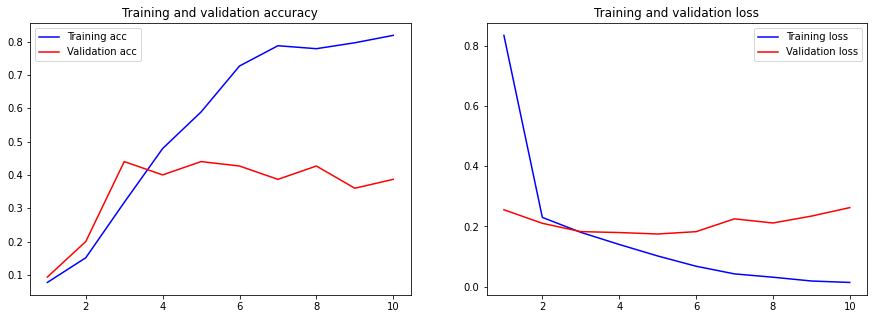

In [25]:
# TRAINING VS VALIDATION
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc)+1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.plot(epochs, acc, 'b', label="Training acc")
ax1.plot(epochs, val_acc, 'r', label="Validation acc")
ax1.set_title('Training and validation accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'b', label="Training loss")
ax2.plot(epochs, val_loss, 'r', label="Validation loss")
ax2.set_title('Training and validation loss')
ax2.legend()

In [26]:
# CLEANING MEMORY FROM VGG MODEL
del base_model_V
del head_model_V
del history
gc.collect()

1837

<div class="alert alert-block alert-info">
<b>ITERATION 5:</b> A second architecture used is GoogleNet, it uses submodules known as Inception. The modules propose to use different kernel-sizes which can be beneficial for image classification. Larger kernels are preferred for mor global features that are distributed over larger area of the image. On the other hand smaller kernels provide useful information in area-specific sections. The convoultions with different filter sizes are performed in parallel in the same layer. Indeed, the results were much better than the VGG model, having a validation accuracy of 70% and approximately 75% after fine tunning.  
</div>

In [27]:
def classifier_inception():
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224,224,3))
    for layer in base_model.layers:
        layer.trainable = False
    # base_model.summary()
    x = layers.Flatten()(base_model.output)
    x = layers.Dense(2048, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(2048, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    predictions = layers.Dense(20, activation = 'sigmoid')(x)
    head_model = Model(inputs = base_model.input, outputs = predictions)
    return head_model

head_model = classifier_inception()
head_model.compile(optimizer= optimizers.Adam(), loss=losses.binary_crossentropy, metrics=['accuracy'])
# head_model.summary()

87924736/87910968 [==============================] - 0s 0us/step


In [28]:
history = head_model.fit(train_X, train_Y, epochs=10, batch_size=50, validation_data = (valX, valY), verbose = verbose_model)

In the next cell, it is possible to observe how the loss remains close to 0, and the improvement on the validation accuracy. We can conclude that we found a model that will classify correctly the pictures around 70% of the time, which is good enough for the scope of the project. We believe it can be improved even more through data augmentation techniques or testing a different pre-trained architecture. 

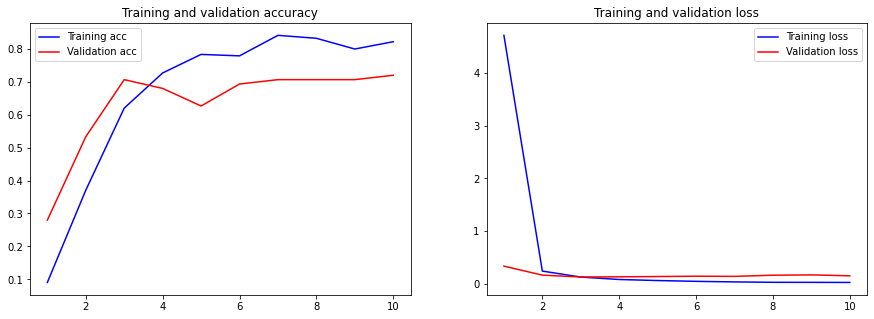

In [29]:
# TRAINING VS VALIDATION
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc)+1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.plot(epochs, acc, 'b', label="Training acc")
ax1.plot(epochs, val_acc, 'r', label="Validation acc")
ax1.set_title('Training and validation accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'b', label="Training loss")
ax2.plot(epochs, val_loss, 'r', label="Validation loss")
ax2.set_title('Training and validation loss')
ax2.legend()

One last step can be performed when we use Transfer Learning techniques and is to apply a **Fine_Tunning** process. We will _unfreeze_ the base model allowing it to be trained, moreover the learning rate should be much smaller than the previous training to avoid damaging the pretrained weights, but at the same time adapt the kernel values to the actual dataset. We will do it just for 1 epoch, to do not change a lot the value of the weights and remain with almost the same validation_accuracy. It is important that the training is performed over the previous training, so we don't define again the model.  

In [30]:
# FINE TUNNING
for layer in head_model.layers:
    layer.trainable = True
# head_model.summary()
head_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
                   loss=losses.binary_crossentropy, 
                   metrics=['accuracy'])
history = head_model.fit(train_X, train_Y, epochs=1, batch_size=32, validation_data = (valX, valY), verbose = 1)
save_model(head_model, "/kaggle/working/savedmodel.h5")

22/22 [==============================] - 13s 261ms/step - loss: 0.0917 - accuracy: 0.6187 - val_loss: 0.1397 - val_accuracy: 0.7333


Let's analyze the same image that was predicted for the scratch model. Running the next 2 cells can be observed that the probability of a sofa is a 0.97 so the classification is correct, and the value for a chair is 0.20, which bring us to a new hyperparameter. What should be the **probability treshold** to define if a class is present in an image? 
We have proposed 0.31 as the treshold, it was done through inspection of 50 pictures of the test dataset. It can be observed that in this example, 'chair' is not above the treshold, therefore in the one-hot vector it will have a value of 0, even if the reality is that the chair is present. 

We believe that the probability for the chair is so low because not all of the characteristic features of a chair are present in the image (such as the legs). Analogously this is a problem in other images. Another problem for miss-classification is the change of resolution, sometimes it fools the CNN. For example a cow tend to be more fat than a horse, but because the change of resolution, now the cow seem to be more thin as a horse and the model classifies incorrectly. 

Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='object')
[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0]
sofa(0.997)
chair(0.341)
tvmonitor(0.204)
pottedplant(0.0342)
bus(0.0202)


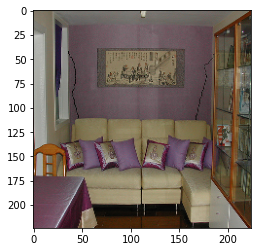

In [31]:
img = test_x[2]
img2 = np.expand_dims(img, axis=0)
plt.imshow(img)

classes = np.array(df.columns[0:20])
prob = head_model.predict(img2)
sorted_categories = np.argsort(prob[0])[:-11:-1]
p_flat = np.reshape(prob, 20)

# CREATE THE ONE-HOT VECTOR WITH THE TRESHOLD PROBABILITY
one_hot = np.array([int(p_flat[i] > 0.31) for i in range(20)])

print(labels)
print(one_hot)

for i in range(5):
    print("{}".format(classes[sorted_categories[i]]) +"({:.3})".format(prob[0][sorted_categories[i]]))

Let's take a look in a 3 more examples. 
- The first one is a correct multi-classification where a chair and a dinning table are present, the probabilities are high, therefore the image was classified correctly. All the characteristics of a _table_ and even _4 chairs_ are present. [30]
- The second one is a wrong classification: the model is 100% sure that there is a train, but in reality there is no train there. Why? Normally in a picture of a train we can find railways, which are interpreted as a feature of the train. The image are just the railways, therefore we can say our model is confused. [16]
- Something similar happens in the third experiment. The model predicts a human, when he is not there. And there are two main reasons. It was observed that human pictures have a good amount number of pictures in the training set, so if we are still dealing with overfitting it could be normal to classify humans when they are not there. The second one are the high-level features present that can be associated with human: house, grass, fence. Even, the 'horse'class get a relatively high probability, and it could be related with the grass (color and texture).

(-0.5, 223.5, 223.5, -0.5)

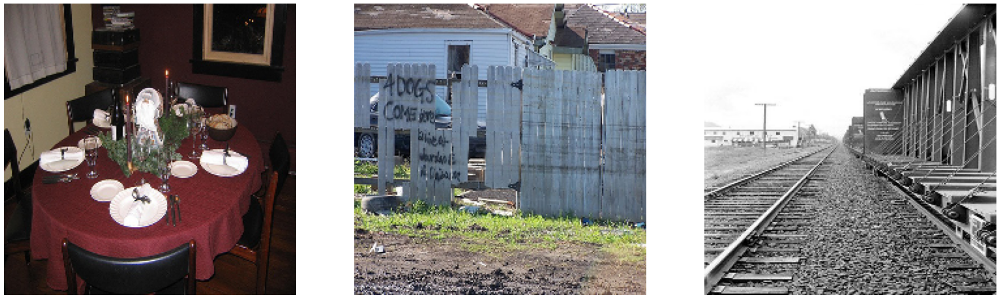

In [32]:
# PLOT THE 3 PICTURES TO ANALYZE
fig, axs = plt.subplots(1, 3, figsize=(30, 10))
axs[0].imshow(test_x[30], vmin=0, vmax=255)
axs[0].axis("off")
axs[1].imshow(test_x[15], vmin=0, vmax=255)
axs[1].axis("off")
axs[2].imshow(test_x[16], vmin=0, vmax=255)
axs[2].axis("off")

In [33]:
# CORRECT CLASSIFICATION - DINNING TABLE
img = test_x[30]
img2 = np.expand_dims(img, axis=0)
prob = head_model.predict(img2)
sorted_categories = np.argsort(prob[0])[:-11:-1]
for i in range(3):
    print("{}".format(classes[sorted_categories[i]]) +"({:.3})".format(prob[0][sorted_categories[i]]))

diningtable(0.999)
chair(0.958)
person(0.0422)


In [34]:
# WRONG CLASSIFICATION - PERSON/HORSE
img = test_x[15]
img2 = np.expand_dims(img, axis=0)
prob = head_model.predict(img2)
sorted_categories = np.argsort(prob[0])[:-11:-1]
for i in range(3):
    print("{}".format(classes[sorted_categories[i]]) +"({:.3})".format(prob[0][sorted_categories[i]]))

person(0.443)
bicycle(0.435)
horse(0.384)


In [35]:
# WRONG CLASSIFICATION - TRAIN
img = test_x[16]
img2 = np.expand_dims(img, axis=0)
prob = head_model.predict(img2)
sorted_categories = np.argsort(prob[0])[:-11:-1]
for i in range(3):
    print("{}".format(classes[sorted_categories[i]]) +"({:.3})".format(prob[0][sorted_categories[i]]))

train(1.0)
aeroplane(0.00432)
bicycle(0.00197)


To finish with the classification process, we predict for all the test-set. After that we do a one-hot encoding as it was shown previously: all the probabilities are compared with the threshold and if they are greater than 0.31 the class will have a 1 instead of a 0. Finally, the numpy array is saved in the pandas data-frame. Later on the submission can be performed. 

In [36]:
# COMPUTE A PREDICTION FOR ALL THE TRAINING SET
prob = head_model.predict(test_x)

In [37]:
# GENERATE ONE-HOT VECTOR FOR ALL THE TEST-SET
test_y1 = []
for i in range(len(prob)):
    p = np.sum(prob[i])
    p_flat = np.reshape(prob[i], 20)
    # flat_arr_prob = p_flat/p
    one_hot = np.array([int(p_flat[i] > 0.31) for i in range(20)])
    # one_hot = np.array([int(flat_arr_prob[i] > 0.35) for i in range(20)])
    test_y1.append(one_hot)
test_y = np.array(test_y1)
print(test_y.shape)

(750, 20)


In [38]:
# ASSIGN THE VALUES INTO THE TEST - DATAFRAME
test_df.loc[:, labels] = test_y

In [39]:
del prob
del head_model 
del history
gc.collect()

128741

# 3. Semantic segmentation
The goal here is to implement a segmentation CNN that labels every pixel in the image as belonging to one of the 20 classes (and/or background). Use the training set to train your CNN and compete on the test set (by filling in the segmentation column in the test dataframe). First we compute a preprocessing section of the masks and images, and we do a general inspection of the problem. As a second step we generate a model from scratch, proposing a new loss function called dice_loss. A final part is a proposal pretrained model with an Inception module architecture.

## 3.1 Data Preprocessing
As was the case for preprocessing for classification. We need to resize and normalize the images. In this case, the label data is also an image that should have the same resolution as the input image.

We first convert all the images from the data frame to 3 vectors:
train images: (128, 128, 3), a 128 x 128 image with 3 channels for RGB values between 0 and 1
label images: (128, 128) image that has a value between 0 and 20 at each pixel which represents the class of that pixel
test images: the same as the train images

We use the **nearest** method because we need the label data to stay in the [0, 20] range, and we will use the same method of resizing on the input data so that everything is consistent.

In [40]:
train_seg_images = []
train_seg_labels = []
for i in range(len(train_df)):
    df_im = train_df["img"][i]
    df_im = cv2.resize(df_im, dsize=(128, 128), interpolation=cv2.INTER_NEAREST)
    df_im = df_im/255
    train_seg_images.append(df_im)
    
    df_seg = train_df["seg"][i]
    df_seg = cv2.resize(df_seg, dsize=(128, 128), interpolation=cv2.INTER_NEAREST)
    train_seg_labels.append(df_seg)

    
train_seg_x = np.asarray(train_seg_images)
train_seg_y = np.asarray(train_seg_labels)

test_seg_images = []
for i in range(len(test_df)):
    df_im = test_df["img"][i]
    df_im = cv2.resize(df_im, dsize=(128, 128), interpolation=cv2.INTER_NEAREST)
    test_seg_images.append(df_im)
test_seg_x = np.asarray(test_seg_images).astype('float32')/255

In order to effectively train the model, we need to have the same shape for the input image and the labels, so we first extend the label data with 1 extra dimension, which will still hold the same values. 

We then use *to_categorical* to convert the image from (128, 128, 1) to a binary image of shape (128, 128, 21)

In [41]:
from tensorflow.keras.utils import to_categorical

print(train_seg_x.shape)
train_y = np.expand_dims(train_seg_y, axis=3)
train_y = to_categorical(train_y, num_classes=21)
print(train_y.shape)

(749, 128, 128, 3)
(749, 128, 128, 21)


We print some of the processed images as a small check to make sure that all of the images are still the same, and that the prediction labels sense

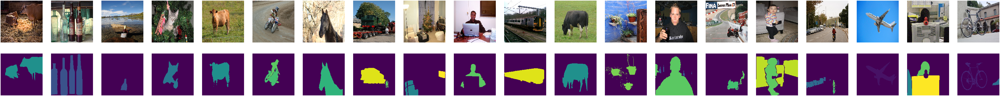

In [42]:
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i in range(20):
    axs[0, i].imshow(train_seg_x[i], vmin=0, vmax=255)
    axs[0, i].axis("off")
    axs[1, i].imshow(train_seg_y[i], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()


For this case we will not split our train dataset in a particular cell, the validation split will be done inside of the fit function of the model. 

## 3.2 Model from scratch

We use a U-Net architecture for our model. The model consists of 3 parts:
1. Downsampling: multiple downsample blocks where each block will double the number of features. This is done to extract contextual features from images 
2. Bottleneck: a bottleneck used to learn compression of the input
3. Upsampling: multiple upsample blocks where each block will half the number of features. Those blocks are used to localize the features

In [43]:
def double_conv_block(x, n_filters):
    x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
    x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
    return x

def downsample_block(x, n_filters):
    f = double_conv_block(x, n_filters)
    p = layers.MaxPool2D(pool_size=(2,2))(f)
    p = layers.Dropout(0.3)(p)
    
    return f,p

def upsample_block(x, conv_features, n_filters):
    x = layers.Conv2DTranspose(n_filters, kernel_size=(3, 3), strides=(2,2), padding = "same")(x)
    x = layers.concatenate([x, conv_features])
    x = layers.Dropout(0.3)(x)
    x = double_conv_block(x, n_filters)
    
    return x

In [44]:
def build_unet_model():
    inputs = layers.Input(shape=(128,128,3))
    
    f1, p1 = downsample_block(inputs, 64)
    f2, p2 = downsample_block(p1, 128)
    f3, p3 = downsample_block(p2, 256)
    f4, p4 = downsample_block(p3, 512)
    
    bottleneck = double_conv_block(p4, 1024)
    
    u6 = upsample_block(bottleneck, f4, 512)
    u7 = upsample_block(u6, f3, 256)
    u8 = upsample_block(u7, f2, 128)
    u9 = upsample_block(u8, f1, 64)
    
    outputs = layers.Conv2D(21, (1, 1), padding = "same", activation = "softmax")(u9)
    
    unet_model = tf.keras.Model(inputs, outputs, name="U-Net")
    
    return unet_model

The problem with our dataset, besides that it is rather small, is the fact that the classes are really unbalanced. In the case of image segmentation, most images have somewhere between 70-90% background, so using accuracy as a metric will lead the model to just predict the background class everywhere and still get really good results. 

In order to solve this, we need to use a loss metric which values the result based on the amount of true positives, so a model that gets would not predict any foreground class as correct would have a loss of 1. Two of the most popular loss metrics are **dice loss** and **intersection over union (IoU)**. They are rather similar, and they both really increase the performance of our model, but we chose **dice loss** because it had better results through multiple tests.

In [45]:
from tensorflow.keras.losses import binary_crossentropy
from tensorflow import reduce_sum
from tensorflow.keras.layers import Flatten
def dsc(y_true, y_pred):
    smooth = 1.
    y_true_f = Flatten()(y_true)
    y_pred_f = Flatten()(y_pred)
    intersection = reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (reduce_sum(y_true_f) + reduce_sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dsc(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

With a high learning rate, the dice loss function tends to converge really quickly to non-optimal solutions, so in order to avoid that, we will use a really small learning rate. Because of the decrease in learning rate, we need to significantly increase the number of epochs our model will be training on, to make sure that it will still converge to an optimal at some point.

In [46]:
unet_model = build_unet_model()
TRAIN_SEG_LEARNING_RATE = 3e-5

unet_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=TRAIN_SEG_LEARNING_RATE), loss=bce_dice_loss, metrics=[dice_loss])
fit = unet_model.fit(train_seg_x, train_y, epochs=400, batch_size=64, validation_split=0.2, verbose = 0)

We will take one of the training images randomly and show it alongside it's given label data  

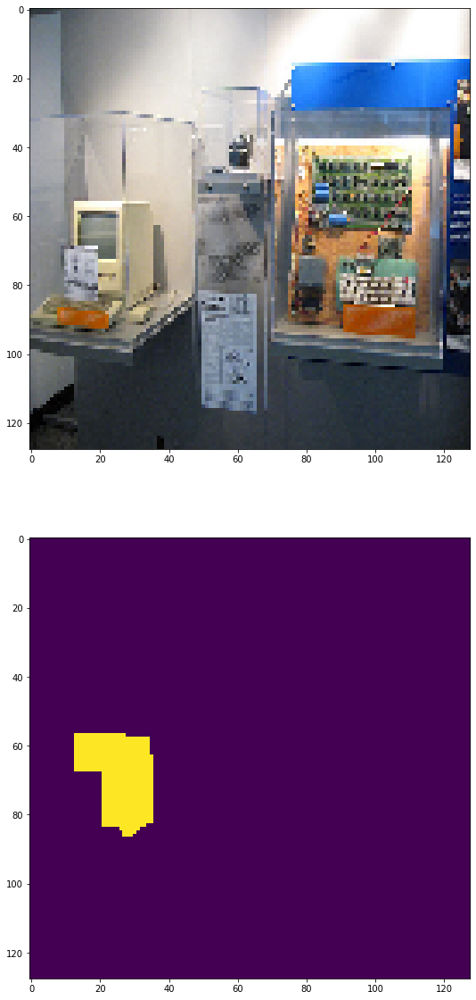

In [47]:
img = train_seg_x[80]
msk = train_seg_y[80]
img2 = np.expand_dims(img, axis=0)

fig, axs = plt.subplots(2, figsize=(10 * 20, 10 * 2))
axs[0].imshow(img, vmin=0, vmax=255)
axs[1].imshow(msk, vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
plt.show()

y_pred = unet_model.predict(img2)

And show the prediciton of that image done by the model

(1, 128, 128, 21)
(1, 128, 128)
9


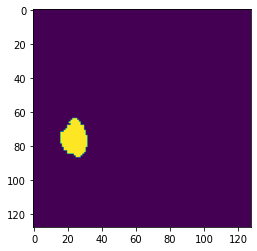

In [48]:
print(y_pred.shape)
y_pred_argmax = np.argmax(y_pred, axis=3)
print(y_pred_argmax.shape)
plt.imshow(y_pred_argmax[0])
print(np.max(y_pred_argmax))

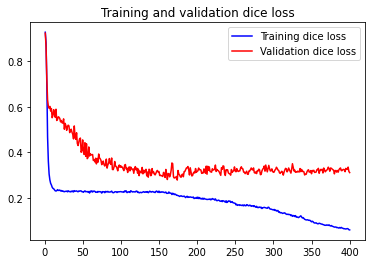

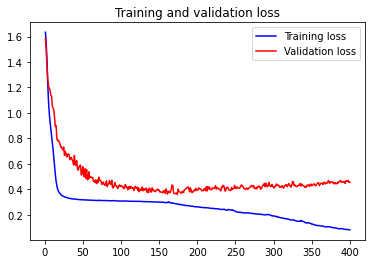

In [49]:
acc = fit.history['dice_loss']
val_acc = fit.history['val_dice_loss']
loss = fit.history['loss']
val_loss = fit.history['val_loss']
epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'b', label="Training dice loss")
plt.plot(epochs, val_acc, 'r', label="Validation dice loss")
plt.title('Training and validation dice loss')
plt.legend()

plt.figure()
plt.plot(epochs, loss, 'b', label="Training loss")
plt.plot(epochs, val_loss, 'r', label="Validation loss")
plt.title('Training and validation loss')
plt.legend()

Now we run the model on all of the test data. Since the output of the prediction is a probability matrix for each class, we will use the **argmax** function to get a final decisive prediciton

In [50]:
test = unet_model.predict(test_seg_x)
test = np.argmax(test, axis=3)

Print 20 of the test images, with the prediction done by the model.

We can notice that the model identifies the shapes of the objects rather well, but the assign classes seem to be pretty random

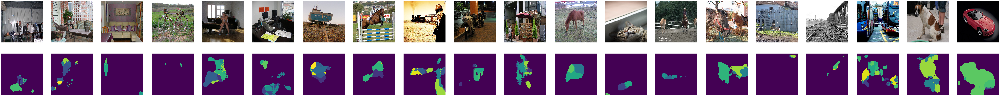

In [51]:
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i in range(20):
    axs[0, i].imshow(test_seg_x[i], vmin=0, vmax=255)
    axs[0, i].axis("off")
    axs[1, i].imshow(test[i], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()


Finally, in order to send the predicitons, we need to resize the predicted images to the size of the initial images. We will again use the **nearest** method to resize them back to keep the values interval, and for consistency.

In [52]:
test_resized = []
for i in range(len(test)):
    img = test[i]
    img = cv2.resize(img, dsize = test_df.iloc[i]["seg"].shape, interpolation=cv2.INTER_NEAREST)
    test_resized.append(img)
    
test_resized = np.asarray(test_resized)

/opt/conda/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


In [53]:
test_df.loc[:, "seg"] = test_resized

## 3.3 Model Pretrained - Inception
<div class="alert alert-block alert-info">
<b>ITERATION 2:</b> In a similar way as it was done on the classification problem, we have decided to implement a model with a previously defined architecture and with its pre-trained weights. We did some pre-iterations with a ResNet and VGG model, but the best results were obtained with ResNet with Inception modules. 
</div>

It might be clear that the structure of the model is pretty similar to the model built from scratch, there are some points that we tried to improve, therefore get better results:
1. As it was explained in the previous section, we use BatchNormalization to avoid overfitting, this time we tried to implement it in a correct way. 
2. The encoding section is a copy of the InceptionResNetV2 model, so using the method .summary() we inspect the size of the layers in which we are going to concatenate and skip layers. Because the inception modules use filters of different sizes, we need to adjust the size of these SKIP CONNECTION lines adding 0's in the edges of the feature map. That is the function of the layers _ZeroPadding()_. 
3. As it was performed previously, we will freeze all the encoding part, allowing the training resources to be used on the decoding section. 
4. Later on, a Fine Tunning operation is performed to train the weights of the filters that are extracting features. 

We took insperation from the video: [Pre-trained Inception ResNetV2 UNET in TensorFlow 2.0 | Pre-trained UNET](https://www.youtube.com/watch?v=hNhatunlk7M) in order to build the model. We needed to adapt some parameters for our application. 

For the scope of the report-notebook, we have decided to don't fit the pre-trained model. It consumes time and memory and the results are almost the same as the Scratch model. Why the results are almost the same? There are 2 main reasons: All the decoding section of the architecture is still to be trainable in both models, the amount of training data is not enough to get proper results. The second reason is the resolution of the pictures, it lose a lot of quality reducing it to $128 \times 128$  

The process to export the data in the pandas DataFrame, is the same as the one used in the previous subsection: resize the mask to the original value, and send to the data_frame. All these cells will be commentented, and in case you want to try it, the cells can be uncommented and executed.

In [54]:
from tensorflow.keras.applications import ResNet50, VGG19, InceptionResNetV2
from keras import backend as K
K.clear_session()

In [55]:
def conv_block(input, num_filters):
    x = layers.Conv2D(num_filters, 3, padding="same")(input)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv2D(num_filters, 3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    return x

def decoder_block(inputs, skip_features, num_filters):
    x = layers.Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = layers.Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_inception_unet():
    """ Input """
    inputs = layers.Input(shape=(128,128,3))
    
    """Pre-Trained Inception Model"""
    base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_tensor = inputs)
    for layer in base_model.layers:
        layer.trainable = False
    # base_model.summary()
    
    """Ëncoder + SKIP CONNECTIONS"""
    s1 = base_model.get_layer("input_1").output    # 128
    s2 = base_model.get_layer("activation").output # 63
    s2 = layers.ZeroPadding2D(((1,0), (1,0)))(s2)  # 64 
    # ZeroPadding: 1 top, 0 bottom // 1 left, 0 right (PIXELS)
    
    s3 = base_model.get_layer("activation_3").output  # 30
    s3 = layers.ZeroPadding2D((1,1))(s3)              # 32
    
    s4 = base_model.get_layer("activation_74").output  # 13
    s4 = layers.ZeroPadding2D(((2,1), (2,1)))(s4)      # 16
    
    """Bottleneck"""
    b1 = base_model.get_layer("activation_161").output # 6
    b1 = layers.ZeroPadding2D((1,1))(b1)               # 8
    
    """Decoder"""
    d1 = decoder_block(b1, s4, 512)  # 16
    d2 = decoder_block(d1, s3, 256)  # 32
    d3 = decoder_block(d2, s2, 128)  # 64
    d4 = decoder_block(d3, s1, 64)  # 128
    
    """Outputs"""
    outputs = layers.Conv2D(21, (1, 1), padding = "same", activation = "softmax")(d4)
    unet_model3 = tf.keras.Model(inputs, outputs)
    return unet_model3

In [56]:
# TRAIN - PRETRAINED MODEL

# head_model = build_inception_unet()
# TRAIN_SEG_LEARNING_RATE = 1e-4
# head_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=TRAIN_SEG_LEARNING_RATE), loss=bce_dice_loss, metrics=[dice_loss])
# fit = head_model.fit(train_seg_x, train_y, epochs=250, batch_size=64, validation_split=0.2, verbose = 1)

In [57]:
# FINE TUNNING
# For fine tunning the learning rate should be smaller.

# TRAIN_SEG_LEARNING_RATE = 1e-5
# for layer in head_model.layers:
#     layer.trainable = True
# head_model.summary()
# head_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=TRAIN_SEG_LEARNING_RATE), loss=bce_dice_loss, metrics=[dice_loss])
# fit = head_model.fit(train_seg_x, train_y, epochs=10, batch_size=64, validation_split=0.2, verbose = 1)

In the next cell, we print a training image with its training mask. After that a 3rd image is printed which is the mask of the same image but now after prediction. We can observe that there is not a perfect segmentation but is close to the real one. Therefore we can go to predict for all the test dataset. It is observed that there is a high degree of similarity on the mask prediction. Even the value of the label-color = 13 which corresponds to horse is correct. Let's remember that in this task 0=background. 

```python
img = train_seg_x[120]
msk = train_seg_y[120]
img2 = np.expand_dims(img, axis=0)

#PREDICTION
y_pred = head_model.predict(img2)
y_pred_argmax = np.argmax(y_pred, axis=3)
print(np.max(y_pred_argmax))

fig, axs = plt.subplots(1, 3, figsize=(30, 10))
axs[0].imshow(img, vmin=0, vmax=255)
axs[1].imshow(msk, vmin=0, vmax=20)
axs[2].imshow(y_pred_argmax[0], vmin=0, vmax=20) # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
plt.show()
```

In [58]:
# test = head_model.predict(test_seg_x)

It is not promising the prediction for a different test_pictures, we can observe on the next cell how incorrect is the segmentation. It is possible that the resolution of the pictures are fooling the model, therefore the predictions are wrong. 

In [59]:
# img = test_seg_x[70]
# y_pred_argmax = np.argmax(test, axis=3)
# fig, axs = plt.subplots(1, 2, figsize=(20, 10))
# axs[0].imshow(img, vmin=0, vmax=255)
# axs[1].imshow(y_pred_argmax[70], vmin=0, vmax=20)
# plt.show()

In [60]:
# img = y_pred_argmax[2]
# print(img.shape)
# img = cv2.resize(img, dsize = test_df.iloc[2]["seg"].shape, interpolation=cv2.INTER_NEAREST)
# print(img.shape)

# test_resized = []
# for i in range(len(test)):
#     img = y_pred_argmax[i]
#     img = cv2.resize(img, dsize = test_df.iloc[i]["seg"].shape, interpolation=cv2.INTER_NEAREST)
#     test_resized.append(img)
    
# test_resized = np.asarray(test_resized)

In [61]:
# test_df.loc[:, "seg"] = test_resized

[Semantic segmentation](https://www.tensorflow.org/tutorials/images/segmentation) datasets can be highly imbalanced meaning that particular class pixels can be present more inside images than that of other classes. Since segmentation problems can be treated as per-pixel classification problems, you can deal with the imbalance problem by weighing the loss function to account for this. It's a simple and elegant way to deal with this problem. All the weights should be introduced as a dictionary object. Sadly, we were not able to implement this approach because tensorflow doesn't allow class_weights for more than 3 classes. But is an approach that we tried. 

```python
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight

labelencoder = LabelEncoder()
train_y_reshaped = train_y.reshape(-1,1)
train_y_encoded = labelencoder.fit_transform(train_y_reshaped)
train_y_encoded.shape

# COMPUTE CLASS WEIGHTS
class_weights = compute_class_weight(class_weight = "balanced", classes= np.unique(train_y_encoded), y= train_y_encoded)
dict_weights = dict(enumerate(class_weights))
# dict_weights
```

## Submit to competition
You don't need to edit this section. Just use it at the right position in the notebook. See the definition of this function in Sect. 1.3 for more details.

In [62]:
generate_submission(test_df)

,Predicted
Id,
0_classification,11 1 15 1
0_segmentation,102895 3 103270 3 103645 3 104020 3 104395 3 1...
1_classification,9 1 11 1 16 1 18 1
1_segmentation,502735 3 503150 3 503565 3 503980 3 506049 3 5...
2_classification,9 1 18 1
...,...
747_segmentation,517355 6 517730 6 518105 6 518480 6 518855 3 5...
748_classification,15 1
748_segmentation,454581 3 454955 3 455329 3 455703 3 456068 3 4...


# 4. Adversarial attack
Below we managed to build a simple adversary attacker for our selected model(in this case its InceptionV3 model). It takes an input picture and label we want to eliminate and attempts to make subtle changes in the image, to confuse the classifier. It introduces delta image, which is trainable randomly generated tensorflow matrix of small values, that is added to the image on each pass.

The code takes the data about how our classifier reacted to the modified image and tries to modify its delta matrix accordingly using optimizer. After several iterations of this process we get a modified image, that is no longer recognized by the classifier with the original class, but is still almost identical for a human.

Such attack could be really dangerous for autonomous vehicles, where the vehicle would not recognize another vehicle ahead and would crush into it in full speed.

Following code was heavily inspired by this [tutorial](https://pyimagesearch.com/2020/10/19/adversarial-images-and-attacks-with-keras-and-tensorflow/).

In [63]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.applications.resnet50 import decode_predictions
from tensorflow.keras.applications.resnet50 import preprocess_input
from keras.models import load_model
import tensorflow as tf
import numpy as np
import argparse
import cv2
import math

In [64]:
#utility functions
def normalize(image):
    image = tf.cast(image, tf.float32) /255.0
    return image

def clip_eps(tensor, eps):
    # clip the values of the tensor to a given range and return it
    return tf.clip_by_value(tensor, clip_value_min=-eps,
        clip_value_max=eps)

In [65]:
EPS = 2 / 255.0
LR = 0.03

optimizer = Adam(learning_rate=LR)
sccLoss = SparseCategoricalCrossentropy()

# in order to achieve seamlessly identical image and big differences in classification, one must fine tune the LR and steps argument of following function

def generate_adversaries(model, baseImage, delta, classIdx, steps=50):
    for step in range(0, steps):
        with tf.GradientTape() as tape:
            tape.watch(delta)
            adversary = normalize(baseImage * 255 + delta)
            predictions = model(adversary, training=False)
            loss = -sccLoss(tf.convert_to_tensor([classIdx]),
                predictions)
            # if we are struggling to find the best fit of steps for our image, we can just look at the loss value.
            # it should tell us when it starts to differ in classification
            print("step: {}, loss: {}...".format(step,loss.numpy()))
        gradients = tape.gradient(loss, delta)
        optimizer.apply_gradients([(gradients, delta)])
        delta.assign_add(clip_eps(delta, eps=EPS))
    # return the modifier matrix
    return delta

step: 0, loss: -4.994744449504651e-05...
step: 1, loss: -5.054346183896996e-05...
step: 2, loss: -5.23315102327615e-05...
step: 3, loss: -5.590759246842936e-05...
step: 4, loss: -6.317892984952778e-05...
step: 5, loss: -7.450303382938728e-05...
step: 6, loss: -8.999896090244874e-05...
step: 7, loss: -0.00010978573118336499...
step: 8, loss: -0.00013398226292338222...
step: 9, loss: -0.000164018536452204...
step: 10, loss: -0.00019834458362311125...
step: 11, loss: -0.00024053541710600257...
step: 12, loss: -0.0002933310461230576...
step: 13, loss: -0.00036554806865751743...
step: 14, loss: -0.0004625442670658231...
step: 15, loss: -0.0005916990339756012...
step: 16, loss: -0.0007695574313402176...
step: 17, loss: -0.0010060969507321715...
step: 18, loss: -0.001335324952378869...
step: 19, loss: -0.0018162912456318736...
step: 20, loss: -0.0024995533749461174...
step: 21, loss: -0.0036118291318416595...


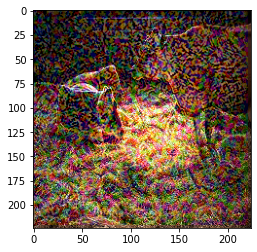

In [66]:
fool_model = load_model("/kaggle/working/savedmodel.h5")
image_to_alter = np.expand_dims(train_x[0], axis=0)
delta = tf.Variable(tf.zeros_like(image_to_alter), trainable=True)
idx = 9
new_delta = generate_adversaries(fool_model, image_to_alter, delta, idx, 22)
adversary = (image_to_alter + new_delta).numpy().squeeze()
#plt.imshow(train_x[0])
plt.imshow(adversary)

In [67]:
pred = fool_model.predict(image_to_alter)
id = pred.tolist()[0].index(max(pred[0]))
print("The original image was " + list(train_df.columns)[id] + " with " + str(math.floor(max(pred[0])*100)) + "% certainty.")

adv = np.expand_dims(adversary, axis=0)
pred = fool_model.predict(adv)
id = pred.tolist()[0].index(max(pred[0]))
print("The modified image is " + list(train_df.columns)[id] + " with " + str(math.floor(max(pred[0])*100)) + "% certainty.")

The original image was cow with 99% certainty.
The modified image is person with 70% certainty.


# 5. Discussion
1. The progress in computer vision has a lot of relationship with the progress in Hardware development. We have discovered that without the use of a GPU the computation time would have taken for so long. We think that using kaggle is a good option due to the 30 free hours of GPU use, and other options such as Google Colab has a lower rate of free time. 

2. As we discussed in our previous assignment, **preprocessing** has a main role in the execution of DNN algorithms. First, the Networks do not like to work with high values, it makes even more difficult to train, and normally images have values from 0 to 255 in 3 different channels, so a normalization is required. The second thing is to unify the size of the training-set and test-set. As it was explained in a previous line, it implies a trade-off between higher resolutions and allocation of memory. We needed to stick to a $128 \times 128$ resolution for the Semantic Segmentation task which generate difficulties to identify features, even for the human eye. We think that the size of the training set was still small but we couldn't find the correct approach of the image segmentation. Internet is full of different resources and each of them follows a different approach, which still made difficult to find a proper solution.

3. **Image classification.** It was insightful generating a model from scratch, we understood that the Convolution layers are used to detect features, and maxpooling is used to reduce dimensions, taking into consideration just the most relevant parts of the feature map. We took a look on BatchNormalization and Dropout, which is related with the amount of parameters to train. Moreover, it is completley worth it to be aware of all the options for Transfer-Learning that we have. For example, ImageNet is a dataset that classifies in 1000 different classes, we are talking that the fully-connected layer has much more parameters than the models that we proposed, hence more time to train and more hardware resources to be used. If the weights are already generated, it is wise to make use of them, and invest efforts in other sections of the project such as pre-processing. 

4. **Semantic Segmentation.** If we need to rate how challenging was the project we can say that this one was the part that took us more time (and also to the GPU). Classification only requires to make a guess for picture, segmentation requires to make a guess for each pixel, which will involve more resources to solve this problem. According to documentatition and previous work, uses RGB images as the mask, so it needs additional steps to convert RGB to categories, in this case, the training mask already had assigned each pixel to one category, we just needed to generate a one-hot vector. 

5. **Adversarial attacks.**
Although there was not much time left to work on Adversarial attack, I believe we managed to make a pretty solid solution. Sure it needs manual tuning and human eye to recognize, whether the resulting image would confuse ordinary watcher, nevertheless it is a functional solution.

6. **General Learning:**
- Half of the course was related to feature extraction and different techniques to do that. In this project was relevant to know that information, even if we don't know the weights of each filter and what is the feature that each filter is extracting. We can analyze the output of each layer, and with it for each channel (related to a filter). Later on, we can make a guess on how the weights of the filters are distributed (at least for the first layers, in which the feature maps are much general such as horizontal or vertical lines. 
- ConvNets could mislead some users to believe that is a "black-box", but a lot of hyperparameters have a mathematical foundation that are helpful to make decisions. For example, we were dealing with a multiclass-multilabel classification, which means that in each image it is possible to find more than one label. In the beginning we thought that softmax + categorical_crossentropy was the solution, but softmax ensures that the sum of all the classes' probabilities is equal to 1. So, low values were obtained when the picture had 2 or more classes on it. So there are also defined standards for certain applications (in this example is sigmoid + Binary_crossentropy). Another example is the use of U-NET for segmentation. The output of a segmentation task is a high-resolution image, and not just a label. So we are taking about one application of first, identify what is in the picture, and later on to reconstruct a picture. Gladly U-NET is a well-known architecture for this case, and the challenge was to implement the model, and make it specific for our application. 

Disclaimers:
1. Regardless of our score we decided to make our last submission on the 24th of May before 23:59
2. As it was mentioned in a previous email, our team is composed of just 3 members which increased the workload for us by a lot
